# **1. Import and Install Dependencies**

## **1.1 Install Dependencies**

In [ ]:
pip install tensorflow==2.13.0

In [ ]:
#pip install tensorboard==2.13.0

In [ ]:
!pip install tensorflow-io matplotlib

## **1.2 Load Dependencies**

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Embedding, MultiHeadAttention, LayerNormalization, Dropout, Dense
from tensorflow.keras.models import Sequential
print(f'TensorFlow Version {tf.__version__}')

TensorFlow Version 2.13.0


In [ ]:
import os
import matplotlib.pyplot as plt
import tensorflow_io as tfio
import numpy as np
import datetime
import librosa

In [ ]:
# Load the TensorBoard notebook extension
#%reload_ext tensorboard

In [ ]:
# Clear any logs from previous runs
#!rm -rf ./logs/

# **2. Build Data Loading Function**

## **2.1 Define Paths to Files**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls

drive  sample_data


In [ ]:
DUSKUS_GODS = os.path.join('drive', 'MyDrive', 'Data', 'Songs', 'Duskus - Gods.wav')

## **2.2 Build Dataloading Function**

In [ ]:
def load_wav_mono(filename):
  # Load encoded wav file
  file_contents = tf.io.read_file(filename)
  # Decode wav (tensors by channels)
  wav, sample_rate = tf.audio.decode_wav(file_contents, desired_channels=1)
  # Removes trailing axis
  wav = tf.squeeze(wav, axis=-1)
  sample_rate = tf.cast(sample_rate, dtype=tf.int64)
  # Goes from 48000Hz to 48000hz - amplitude of the audio signal
  print(sample_rate.numpy())
  return wav

# **3. Create Tensorflow Dataset**

## **3.1 Define Paths to Data**

In [ ]:
MUSIC_DATA_PATH = os.path.join('drive', 'MyDrive', 'Data', 'Songs')

## **3.2 Create Tensorflow Datasets**

In [ ]:
SONG_FILE_PATHS = tf.data.Dataset.list_files(MUSIC_DATA_PATH+'/*.wav')

In [ ]:
# Create an iterator for the dataset
iterator = iter(SONG_FILE_PATHS)

# Get the first element
first_element = next(iterator)

# Convert it to a string
first_element_path = first_element.numpy().decode('utf-8')

# Now you have the path to the first element in the dataset
print(first_element_path)

drive/MyDrive/Data/Songs/BROHUG - Addict.wav


# **4. Determine BPMs of Songs**

In [ ]:
"""BPMs = []
for file in os.listdir(os.path.join('drive', 'MyDrive', 'Data', 'Songs')):
  y, sr = librosa.load(os.path.join('drive', 'MyDrive', 'Data', 'Songs', file))
  tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
  BPMs.append(tempo)"""

"BPMs = []\nfor file in os.listdir(os.path.join('drive', 'MyDrive', 'Data', 'Songs')):\n  y, sr = librosa.load(os.path.join('drive', 'MyDrive', 'Data', 'Songs', file))\n  tempo, _ = librosa.beat.beat_track(y=y, sr=sr)\n  BPMs.append(tempo)"

# **5. Build Preprocessing Function to Convert to Spectrogram**

## **5.1 Build Preprocessing Function**

In [ ]:
def preprocess(file_path):
    wav = load_wav_mono(file_path)
    spectrogram = tf.signal.stft(wav, frame_length=320, frame_step=32)
    spectrogram = tf.abs(spectrogram)
    spectrogram = tf.expand_dims(spectrogram, axis=2)
    return spectrogram

In [ ]:
positives = tf.data.Dataset.zip((SONG_FILE_PATHS))

48000


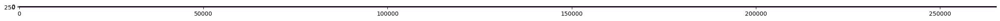

In [ ]:
# Define the dataset
positives = tf.data.Dataset.list_files(MUSIC_DATA_PATH+'/*.wav')

# Shuffle the dataset and take one item
sample = positives.shuffle(buffer_size=10000).take(1)

# Iterate through the dataset
for filepath in sample:
  # Convert the filepath to a string
  filepath = filepath.numpy().decode('utf-8')

  # Call the preprocess function on the file
  spectrogram = preprocess(filepath)  # Assuming label is defined elsewhere

  # Visualize the spectrogram
  plt.figure(figsize=(30, 20))
  plt.imshow(tf.transpose(spectrogram)[0])
  plt.show()

In [ ]:
spectrogram = preprocess(filepath)

48000


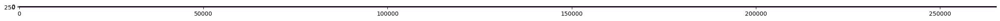

In [ ]:
plt.figure(figsize=(30,20))
plt.imshow(tf.transpose(spectrogram)[0])
plt.show()

## **5.2 Preview Reconstructed Audio**

In [ ]:
from IPython.display import Audio, display

In [ ]:
"""# Convert the reconstructed signal tensor to a NumPy array
reconstructed_signal_np = reconstructed_signal.numpy()

# Play the audio
display(Audio(reconstructed_signal_np, rate=48000, autoplay=True))"""

'# Convert the reconstructed signal tensor to a NumPy array\nreconstructed_signal_np = reconstructed_signal.numpy()\n\n# Play the audio\ndisplay(Audio(reconstructed_signal_np, rate=48000, autoplay=True))'

In [ ]:
del Audio, display

# **6. Tokenize STFT Data**

## **6.1 STFT Params**

In [ ]:
FRAME_LENGTH = 10000
FRAME_STEP = 2000

In [ ]:
song = 0

## **6.2 Extract Y(t) and Convert to I(f, t)**

### **6.2.1 STFT**

In [ ]:
#Data_Y = []
Data_ft = []

count = 0
numToCount = 1

for path in positives:
  wav = load_wav_mono(path)
  #Data_Y.append(wav.numpy())
  spectrogram = tf.abs(tf.signal.stft(wav, frame_length=FRAME_LENGTH, frame_step=FRAME_STEP))
  Data_ft.append(spectrogram.numpy())
  count += 1
  if count >= numToCount:  # Exit the loop after processing the first x files
    break

48000


In [ ]:
numTimes, numFreqs = np.shape(Data_ft[song])
print(f'Times: {numTimes}')
print(f'Freqs: {numFreqs}')

Times: 4240
Freqs: 8193


In [ ]:
highCutoffIdx = int(np.ceil(5 * numFreqs / 6)) + 1

Data_ft[song][:, highCutoffIdx:] = 0

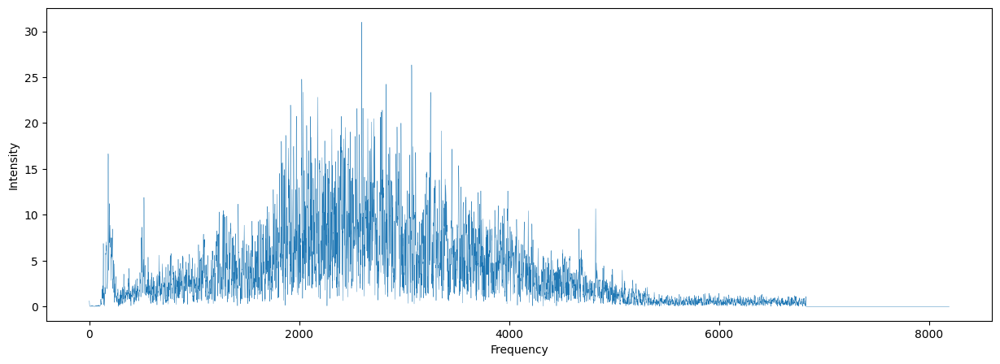

In [ ]:
# Assuming you have a specific figure width you want, adjust it in the figsize tuple
fig, ax = plt.subplots(figsize=(15, 5))  # Adjust the width (15 inches in this case), and height as needed

# Your plotting code
ax.plot(Data_ft[song][100], linewidth=0.3)

# Add x-axis label
ax.set_xlabel('Frequency')

# Add y-axis label
ax.set_ylabel('Intensity')

plt.show()

### **6.2.2 Error**

In [ ]:
"""# Reconstruct the original signal from the STFT
song = 0
spectrogram = Data_ft[song]
phase = tf.math.angle(spectrogram)
real = spectrogram * tf.math.cos(phase)
imag = spectrogram * tf.math.sin(phase)
complex_data = tf.complex(real, imag)
reconstructed_signal = tf.signal.inverse_stft(
    complex_data, frame_length=FRAME_LENGTH, frame_step=FRAME_STEP)"""

'# Reconstruct the original signal from the STFT\nsong = 0\nspectrogram = Data_ft[song]\nphase = tf.math.angle(spectrogram)\nreal = spectrogram * tf.math.cos(phase)\nimag = spectrogram * tf.math.sin(phase)\ncomplex_data = tf.complex(real, imag)\nreconstructed_signal = tf.signal.inverse_stft(\n    complex_data, frame_length=FRAME_LENGTH, frame_step=FRAME_STEP)'

In [ ]:
"""# Assuming 'signal' and 'reconstructed_rounded_signal' are your tensors
# Find the length difference
signal = tf.convert_to_tensor(Data_Y[song])
min_length = tf.minimum(tf.shape(signal)[0], tf.shape(reconstructed_signal)[0])

signal = signal[:min_length]
reconstructed_signal = reconstructed_signal[:min_length]

# Verify the similarity between the original and reconstructed signals
error = tf.reduce_max(tf.abs(signal - reconstructed_signal))
print("Reconstruction error:", error.numpy())"""

'# Assuming \'signal\' and \'reconstructed_rounded_signal\' are your tensors\n# Find the length difference\nsignal = tf.convert_to_tensor(Data_Y[song])\nmin_length = tf.minimum(tf.shape(signal)[0], tf.shape(reconstructed_signal)[0])\n\nsignal = signal[:min_length]\nreconstructed_signal = reconstructed_signal[:min_length]\n\n# Verify the similarity between the original and reconstructed signals\nerror = tf.reduce_max(tf.abs(signal - reconstructed_signal))\nprint("Reconstruction error:", error.numpy())'

### **6.2.3 Pure Reconstruction Audio Quality - EAR TEST**

In [ ]:
from IPython.display import Audio, display

In [ ]:
"""# Convert the reconstructed signal tensor to a NumPy array
reconstructed_signal_np = reconstructed_signal.numpy()

# Play the audio
display(Audio(reconstructed_signal_np, rate=48000, autoplay=True))"""

'# Convert the reconstructed signal tensor to a NumPy array\nreconstructed_signal_np = reconstructed_signal.numpy()\n\n# Play the audio\ndisplay(Audio(reconstructed_signal_np, rate=48000, autoplay=True))'

In [ ]:
del Audio, display

### **6.2.4 Griffin-Lim Algorithm**

In [ ]:
"""# Assuming you have the magnitude_stft and the number of iterations
magnitude_stft = Data_ft[song]
n_iter = 1000  # Adjust the number of iterations as needed

# Initialize the phase randomly
phase = tf.random.uniform(shape=magnitude_stft.shape, minval=-np.pi, maxval=np.pi, dtype=tf.float32)

for i in range(n_iter):
    # Reconstruct complex data
    complex_data = tf.complex(magnitude_stft * tf.math.cos(phase), magnitude_stft * tf.math.sin(phase))

    # Perform inverse STFT with the current phase
    reconstructed_signal = tf.signal.inverse_stft(
        complex_data, frame_length=FRAME_LENGTH, frame_step=FRAME_STEP)

    # Update the phase using the angle of the reconstructed signal
    phase = tf.math.angle(tf.signal.stft(reconstructed_signal, frame_length=FRAME_LENGTH, frame_step=FRAME_STEP))

# The final reconstructed_signal should have less reverb-like effect"""

'# Assuming you have the magnitude_stft and the number of iterations\nmagnitude_stft = Data_ft[song]\nn_iter = 1000  # Adjust the number of iterations as needed\n\n# Initialize the phase randomly\nphase = tf.random.uniform(shape=magnitude_stft.shape, minval=-np.pi, maxval=np.pi, dtype=tf.float32)\n\nfor i in range(n_iter):\n    # Reconstruct complex data\n    complex_data = tf.complex(magnitude_stft * tf.math.cos(phase), magnitude_stft * tf.math.sin(phase))\n\n    # Perform inverse STFT with the current phase\n    reconstructed_signal = tf.signal.inverse_stft(\n        complex_data, frame_length=FRAME_LENGTH, frame_step=FRAME_STEP)\n\n    # Update the phase using the angle of the reconstructed signal\n    phase = tf.math.angle(tf.signal.stft(reconstructed_signal, frame_length=FRAME_LENGTH, frame_step=FRAME_STEP))\n\n# The final reconstructed_signal should have less reverb-like effect'

### **6.2.5 Polished Audio Quality - EAR TEST**

In [ ]:
from IPython.display import Audio, display

In [ ]:
"""# Convert the reconstructed signal tensor to a NumPy array
reconstructed_signal_np = reconstructed_signal.numpy()

# Play the audio
display(Audio(reconstructed_signal_np, rate=48000, autoplay=True))"""

'# Convert the reconstructed signal tensor to a NumPy array\nreconstructed_signal_np = reconstructed_signal.numpy()\n\n# Play the audio\ndisplay(Audio(reconstructed_signal_np, rate=48000, autoplay=True))'

In [ ]:
del Audio, display

# **7. Hyperparameters**

## **7.1 Data Params**

In [ ]:
for path in positives:
  break

In [ ]:
INPUT_VOCAB_SIZE = highCutoffIdx - 1
OUTPUT_VOCAB_SIZE = highCutoffIdx - 1

LENGTH_IN_SECONDS = np.shape(load_wav_mono(path).numpy())[0] / 48000
TOKENS_PER_SONG = numTimes
TOKENS_PER_SECOND = int(np.round(TOKENS_PER_SONG / LENGTH_IN_SECONDS))

print(TOKENS_PER_SECOND)

48000
24


In [ ]:
CONTEXT_SIZE = TOKENS_PER_SECOND * 5          # Number of tokens to consider in input
TOKENS_TO_PREDICT = TOKENS_PER_SECOND * 5     # Number of tokens to generate in output

BATCH_SIZE = 8                                # Batch size

## **7.2 Model Params**

In [ ]:
D_MODEL = INPUT_VOCAB_SIZE                # Model dimension
FEATURE_EMBEDDINGS = 512                  # Number of features in secondary embedding layer
NUM_HEADS = 16                            # Number of heads
D_K = FEATURE_EMBEDDINGS // NUM_HEADS     # Dimension of Q and K
D_V = D_K                                 # Dimension of V
D_FF = 1024                               # Number of neurons in Feed Forward layer

NUM_LAYERS = 4                            # Number of Encoder/Decoder Stacks
DROPOUT_RATE = 0.1                        # Gloabl dropout rate
EPSILON = 0.000001                        # Constant added to ensure nonzero values
WARMUP_STEPS = 6000                       # Warmup (linear increase in learning rate) steps before cooldown
NUM_EPOCHS = 100

# **8. Data for Model**

## **8.1 Create Inputs, Targets, Labels**

In [ ]:
numSamples = [np.shape(Data_ft[i])[0] for i in range(len(Data_ft))]
NUM_DATA_SAMPLES = [numSamples[i] - (CONTEXT_SIZE + TOKENS_TO_PREDICT) for i in range(len(Data_ft))]

In [ ]:
print(NUM_DATA_SAMPLES)

[4000]


In [ ]:
BATCHES_TO_USE = 150

TIMES_PER_SAMPLE = CONTEXT_SIZE + TOKENS_TO_PREDICT
TIMES_PER_BATCH = TIMES_PER_SAMPLE * BATCH_SIZE

NUM_DATA_SAMPLES = [BATCH_SIZE * BATCHES_TO_USE]

In [ ]:
print(NUM_DATA_SAMPLES)

[1200]


In [ ]:
for i in range(len(Data_ft)):
  Data_ft[i] = Data_ft[i][:, :highCutoffIdx]

In [ ]:
inputX = np.array([Data_ft[songIdx][dataSampleIdx:dataSampleIdx+CONTEXT_SIZE][:,:-1] for songIdx in range(len(Data_ft)) for dataSampleIdx in range(NUM_DATA_SAMPLES[songIdx])], dtype=np.float32)

inputX[:, :, -1] = 0.0     # set aside the final dimension of the embedding to be used for the start token exclusively

np.shape(inputX)

(1200, 120, 6828)

In [ ]:
trueY = np.array(
    [Data_ft[songIdx][dataSampleIdx + CONTEXT_SIZE:dataSampleIdx + CONTEXT_SIZE + TOKENS_TO_PREDICT][:,:-1]
     for songIdx in range(len(Data_ft)) for dataSampleIdx in range(NUM_DATA_SAMPLES[songIdx])],
    dtype=np.float32
)

trueY[:, :, -1] = 0.0     # set aside the final dimension of the embedding to be used for the start token exclusively

np.shape(trueY)

(1200, 120, 6828)

In [ ]:
# Calculate the shape of the inputY without the last dimension
inputY_shape = (trueY.shape[0], 1, trueY.shape[2])

# Create an empty inputY with the desired shape
inputY = np.zeros(inputY_shape, dtype=trueY.dtype)

# Set the last element in the third axis to 1 for the first term in the sequence
inputY[:, 0, -1] = 1.0

# Append the inputY to the trueY array
inputY = np.concatenate((inputY, trueY[:,:-1,:]), axis=1)

# Verify the shape of the modified array
print(inputY.shape)

(1200, 120, 6828)


## **8.2 Check for Nan Values**

In [ ]:
"""# Find NaN values in inputX
nan_indices_inputX = np.argwhere(np.isnan(inputX))
if len(nan_indices_inputX) > 0:
    for i, j, k in nan_indices_inputX:
        print(f"NaN found in inputX at index ({i}, {j}, {k})")

# Find NaN values in inputY
nan_indices_inputY = np.argwhere(np.isnan(inputY))
if len(nan_indices_inputY) > 0:
    for i, j, k in nan_indices_inputY:
        print(f"NaN found in inputY at index ({i}, {j}, {k})")

# Find NaN values in trueY
nan_indices_trueY = np.argwhere(np.isnan(trueY))
if len(nan_indices_trueY) > 0:
    for i, j, k in nan_indices_trueY:
        print(f"NaN found in trueY at index ({i}, {j}, {k})")"""

'# Find NaN values in inputX\nnan_indices_inputX = np.argwhere(np.isnan(inputX))\nif len(nan_indices_inputX) > 0:\n    for i, j, k in nan_indices_inputX:\n        print(f"NaN found in inputX at index ({i}, {j}, {k})")\n\n# Find NaN values in inputY\nnan_indices_inputY = np.argwhere(np.isnan(inputY))\nif len(nan_indices_inputY) > 0:\n    for i, j, k in nan_indices_inputY:\n        print(f"NaN found in inputY at index ({i}, {j}, {k})")\n\n# Find NaN values in trueY\nnan_indices_trueY = np.argwhere(np.isnan(trueY))\nif len(nan_indices_trueY) > 0:\n    for i, j, k in nan_indices_trueY:\n        print(f"NaN found in trueY at index ({i}, {j}, {k})")'

In [ ]:
#nan_indices_inputX

In [ ]:
#nan_indices_inputY

In [ ]:
#nan_indices_trueY

## **8.3 Partition Data Into Train/Test**

In [ ]:
#NUM_BATCHES = int(np.floor(sum(NUM_DATA_SAMPLES) / BATCH_SIZE))
#BATCHES_TO_TRAIN = int(np.round(0.8*NUM_BATCHES))
BATCHES_TO_TRAIN = int(0.8 * BATCHES_TO_USE)
SAMPLES_TO_TRAIN = BATCHES_TO_TRAIN * BATCH_SIZE

In [ ]:
inputX_train = inputX[0:SAMPLES_TO_TRAIN, :]
inputX_val = inputX[SAMPLES_TO_TRAIN:BATCH_SIZE*BATCHES_TO_USE, :]

inputY_train = inputY[0:SAMPLES_TO_TRAIN,:]
inputY_val = inputY[SAMPLES_TO_TRAIN:BATCH_SIZE*BATCHES_TO_USE, :]

trueY_train = trueY[0:SAMPLES_TO_TRAIN,:]
trueY_val = trueY[SAMPLES_TO_TRAIN:BATCH_SIZE*BATCHES_TO_USE, :]

# Prepare the training dataset
train_dataset = tf.data.Dataset.from_tensor_slices(((inputX_train, inputY_train), trueY_train))     # slices along the first axis of both sets
train_dataset = train_dataset.batch(BATCH_SIZE)     # creates batches of slices, of size batch_size

# Prepare the validation dataset
val_dataset = tf.data.Dataset.from_tensor_slices(((inputX_val, inputY_val), trueY_val))
val_dataset = val_dataset.batch(BATCH_SIZE)

In [ ]:
"""GROUP_SIZE = int(np.floor(BATCH_SIZE / 0.8))
NUM_GROUPS = int(np.floor(NUM_DATA_SAMPLES[0] / GROUP_SIZE))"""

'GROUP_SIZE = int(np.floor(BATCH_SIZE / 0.8))\nNUM_GROUPS = int(np.floor(NUM_DATA_SAMPLES[0] / GROUP_SIZE))'

In [ ]:
"""inputX_train = np.empty((0, CONTEXT_SIZE, D_MODEL))
inputX_val = np.empty((0, CONTEXT_SIZE, D_MODEL))

inputY_train = np.empty((0, TOKENS_TO_PREDICT, D_MODEL))
inputY_val = np.empty((0, TOKENS_TO_PREDICT, D_MODEL))

trueY_train = np.empty((0, TOKENS_TO_PREDICT, D_MODEL))
trueY_val = np.empty((0, TOKENS_TO_PREDICT, D_MODEL))

for group in range(NUM_GROUPS):
  train_start_index = group * GROUP_SIZE
  train_end_index = group * GROUP_SIZE + BATCH_SIZE
  val_start_index = group * GROUP_SIZE + BATCH_SIZE
  val_end_index = (group + 1) * GROUP_SIZE

  inputX_train = np.concatenate((inputX_train, inputX[train_start_index:train_end_index]), axis=0)
  inputY_train = np.concatenate((inputY_train, inputY[train_start_index:train_end_index]), axis=0)
  trueY_train = np.concatenate((trueY_train, trueY[train_start_index:train_end_index]), axis=0)

  inputX_val = np.concatenate((inputX_val, inputX[val_start_index:val_end_index]), axis=0)
  inputY_val = np.concatenate((inputY_val, inputY[val_start_index:val_end_index]), axis=0)
  trueY_val = np.concatenate((trueY_val, trueY[val_start_index:val_end_index]), axis=0)


train_dataset = tf.data.Dataset.from_tensor_slices(((inputX_train, inputY_train), trueY_train))
val_dataset = tf.data.Dataset.from_tensor_slices(((inputX_val, inputY_val), trueY_val))"""

'inputX_train = np.empty((0, CONTEXT_SIZE, D_MODEL))\ninputX_val = np.empty((0, CONTEXT_SIZE, D_MODEL))\n\ninputY_train = np.empty((0, TOKENS_TO_PREDICT, D_MODEL))\ninputY_val = np.empty((0, TOKENS_TO_PREDICT, D_MODEL))\n\ntrueY_train = np.empty((0, TOKENS_TO_PREDICT, D_MODEL))\ntrueY_val = np.empty((0, TOKENS_TO_PREDICT, D_MODEL))\n\nfor group in range(NUM_GROUPS):\n  train_start_index = group * GROUP_SIZE\n  train_end_index = group * GROUP_SIZE + BATCH_SIZE\n  val_start_index = group * GROUP_SIZE + BATCH_SIZE\n  val_end_index = (group + 1) * GROUP_SIZE\n\n  inputX_train = np.concatenate((inputX_train, inputX[train_start_index:train_end_index]), axis=0)\n  inputY_train = np.concatenate((inputY_train, inputY[train_start_index:train_end_index]), axis=0)\n  trueY_train = np.concatenate((trueY_train, trueY[train_start_index:train_end_index]), axis=0)\n\n  inputX_val = np.concatenate((inputX_val, inputX[val_start_index:val_end_index]), axis=0)\n  inputY_val = np.concatenate((inputY_val, in

In [ ]:
"""# Create slices for train and validation datasets
train_slices_inputX = []
train_slices_inputY = []
train_slices_trueY = []
val_slices_inputX = []
val_slices_inputY = []
val_slices_trueY = []

for group in range(NUM_GROUPS):
    train_start_index = group * GROUP_SIZE
    train_end_index = group * GROUP_SIZE + BATCH_SIZE
    val_start_index = group * GROUP_SIZE + BATCH_SIZE
    val_end_index = (group + 1) * GROUP_SIZE

    train_slices_inputX.append(slice(train_start_index, train_end_index))
    train_slices_inputY.append(slice(train_start_index, train_end_index))
    train_slices_trueY.append(slice(train_start_index, train_end_index))
    val_slices_inputX.append(slice(val_start_index, val_end_index))
    val_slices_inputY.append(slice(val_start_index, val_end_index))
    val_slices_trueY.append(slice(val_start_index, val_end_index))

# Concatenate slices to create train and validation datasets
inputX_train = np.concatenate([inputX[s] for s in train_slices_inputX], axis=0)
inputY_train = np.concatenate([inputY[s] for s in train_slices_inputY], axis=0)
trueY_train = np.concatenate([trueY[s] for s in train_slices_trueY], axis=0)
inputX_val = np.concatenate([inputX[s] for s in val_slices_inputX], axis=0)
inputY_val = np.concatenate([inputY[s] for s in val_slices_inputY], axis=0)
trueY_val = np.concatenate([trueY[s] for s in val_slices_trueY], axis=0)"""

'# Create slices for train and validation datasets\ntrain_slices_inputX = []\ntrain_slices_inputY = []\ntrain_slices_trueY = []\nval_slices_inputX = []\nval_slices_inputY = []\nval_slices_trueY = []\n\nfor group in range(NUM_GROUPS):\n    train_start_index = group * GROUP_SIZE\n    train_end_index = group * GROUP_SIZE + BATCH_SIZE\n    val_start_index = group * GROUP_SIZE + BATCH_SIZE\n    val_end_index = (group + 1) * GROUP_SIZE\n\n    train_slices_inputX.append(slice(train_start_index, train_end_index))\n    train_slices_inputY.append(slice(train_start_index, train_end_index))\n    train_slices_trueY.append(slice(train_start_index, train_end_index))\n    val_slices_inputX.append(slice(val_start_index, val_end_index))\n    val_slices_inputY.append(slice(val_start_index, val_end_index))\n    val_slices_trueY.append(slice(val_start_index, val_end_index))\n\n# Concatenate slices to create train and validation datasets\ninputX_train = np.concatenate([inputX[s] for s in train_slices_inputX

In [ ]:
"""# Convert to TensorFlow Datasets
train_dataset = tf.data.Dataset.from_tensor_slices(((inputX_train, inputY_train), trueY_train)).batch(BATCH_SIZE)
val_dataset = tf.data.Dataset.from_tensor_slices(((inputX_val, inputY_val), trueY_val)).batch(BATCH_SIZE)"""

'# Convert to TensorFlow Datasets\ntrain_dataset = tf.data.Dataset.from_tensor_slices(((inputX_train, inputY_train), trueY_train)).batch(BATCH_SIZE)\nval_dataset = tf.data.Dataset.from_tensor_slices(((inputX_val, inputY_val), trueY_val)).batch(BATCH_SIZE)'

In [ ]:
train_dataset
val_dataset

<_BatchDataset element_spec=((TensorSpec(shape=(None, 120, 6828), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120, 6828), dtype=tf.float32, name=None)), TensorSpec(shape=(None, 120, 6828), dtype=tf.float32, name=None))>

# **9. Build and Test Functions for Transformer Model**

## **9.1 Grab a batch for Testing**

In [ ]:
for (batch, ((x_batch_train, y_batch_train), true_y_batch_train)) in enumerate(train_dataset):
  break

In [ ]:
print(x_batch_train.shape)
print(y_batch_train.shape)
print(true_y_batch_train.shape)

(8, 120, 6828)
(8, 120, 6828)
(8, 120, 6828)


In [ ]:
"""testingX = Data_ft[0][1000:1002][:,:-1]     # Song 0, Times 0-1, up through the penultimate frequency (get dimension to be a multiple of NUM_HEADS)
testingY = Data_ft[0][1002:1004][:,:-1]
print(f'Number of frequencies per time step: {np.shape(testingX)[1]}')

for i in range(np.shape(testingX)[0]):
  plt.plot(testingX[i], label=f'Time Step {i}', linewidth=0.1)

plt.legend()
plt.xlabel('Frequency')
plt.ylabel('Intensity')
plt.title('Frequency vs Intensity for One Time Step')
plt.show()"""

"testingX = Data_ft[0][1000:1002][:,:-1]     # Song 0, Times 0-1, up through the penultimate frequency (get dimension to be a multiple of NUM_HEADS)\ntestingY = Data_ft[0][1002:1004][:,:-1]\nprint(f'Number of frequencies per time step: {np.shape(testingX)[1]}')\n\nfor i in range(np.shape(testingX)[0]):\n  plt.plot(testingX[i], label=f'Time Step {i}', linewidth=0.1)\n\nplt.legend()\nplt.xlabel('Frequency')\nplt.ylabel('Intensity')\nplt.title('Frequency vs Intensity for One Time Step')\nplt.show()"

In [ ]:
"""testingX = tf.convert_to_tensor(testingX)
testingY = tf.convert_to_tensor(testingY)"""

'testingX = tf.convert_to_tensor(testingX)\ntestingY = tf.convert_to_tensor(testingY)'

In [ ]:
"""batchTestingX = tf.expand_dims(testingX, axis=0)
batchTestingY = tf.expand_dims(testingY, axis=0)"""

'batchTestingX = tf.expand_dims(testingX, axis=0)\nbatchTestingY = tf.expand_dims(testingY, axis=0)'

## **9.2 Embeddings**

In [ ]:
"""CONTEXT_SIZE = 2"""

'CONTEXT_SIZE = 2'

In [ ]:
def positional_encoding(length, depth):
  depth = depth/2

  positions = np.arange(length)[:, np.newaxis]     # (seq, 1)
  depths = np.arange(depth)[np.newaxis, :]/depth   # (1, depth)

  angle_rates = 1 / (10000**depths)         # (1, depth)
  angle_rads = positions * angle_rates      # (pos, depth)

  pos_encoding = np.concatenate(
      [np.sin(angle_rads), np.cos(angle_rads)],
      axis=-1)

  return tf.cast(pos_encoding, dtype=tf.float32)


class PositionalEmbedding(tf.keras.layers.Layer):
  def __init__(self, vocab_size, d_model, num_features):
    super().__init__()
    self.d_model = d_model
    self.num_features = num_features
    self.linear_layer = tf.keras.layers.Dense(num_features, use_bias=True, activation='relu')
    self.pos_encoding = positional_encoding(length=CONTEXT_SIZE, depth=num_features)

  def compute_mask(self, inputs, mask=None):
    # The mask returned by this layer is the same as the one received (identity mask).
    return mask

  def call(self, x, mask=None):
    length = tf.shape(x)[1]

    # Apply the linear layer to x
    x = self.linear_layer(x)

    x = x + self.pos_encoding[tf.newaxis, :length, :]
    return x

In [ ]:
# We only use one embedder since the input and output vocab are the same
# (use two embedders if it's a vision transformer, one language to another
# language, etc)
gen_embed = PositionalEmbedding(vocab_size=INPUT_VOCAB_SIZE, d_model=D_MODEL, num_features=FEATURE_EMBEDDINGS)

x_emb = gen_embed(x_batch_train)
y_emb = gen_embed(y_batch_train)

print(f'x_emb shape: {x_emb.shape}')
print(f'y_emb shape: {y_emb.shape}')

x_emb shape: (8, 120, 512)
y_emb shape: (8, 120, 512)


## **9.3 Attention Types**

In [ ]:
class BaseAttention(tf.keras.layers.Layer):
  def __init__(self, **kwargs):
    super().__init__()
    self.mha = tf.keras.layers.MultiHeadAttention(**kwargs)
    self.layernorm = tf.keras.layers.LayerNormalization()
    self.add = tf.keras.layers.Add()

In [ ]:
class CrossAttention(BaseAttention):
  def call(self, x, context):
    attn_output, attn_scores = self.mha(
        query=x,
        key=context,
        value=context,
        return_attention_scores=True)

    # Cache the attention scores for plotting later.
    self.last_attn_scores = attn_scores

    x = self.add([x, attn_output])
    x = self.layernorm(x)

    return x

In [ ]:
sample_ca = CrossAttention(num_heads=NUM_HEADS, key_dim=D_K)

print(sample_ca(x_emb, y_emb).shape)

(8, 120, 512)


In [ ]:
class GlobalSelfAttention(BaseAttention):
  def call(self, x):
    attn_output = self.mha(
        query=x,
        value=x,
        key=x)
    x = self.add([x, attn_output])
    x = self.layernorm(x)
    return x

In [ ]:
sample_gsa = GlobalSelfAttention(num_heads=NUM_HEADS, key_dim=D_K)

print(sample_gsa(x_emb).shape)

(8, 120, 512)


In [ ]:
class CausalSelfAttention(BaseAttention):
  def call(self, x):
    attn_output = self.mha(
        query=x,
        value=x,
        key=x,
        use_causal_mask = True)
    x = self.add([x, attn_output])
    x = self.layernorm(x)
    return x

In [ ]:
sample_csa = CausalSelfAttention(num_heads=NUM_HEADS, key_dim=D_K)

print(sample_csa(y_emb).shape)

(8, 120, 512)


## **9.4 Feed Forward**

In [ ]:
class FeedForward(tf.keras.layers.Layer):
  def __init__(self, num_features, dff, dropout_rate=0.1):
    super().__init__()
    self.seq = tf.keras.Sequential([
      tf.keras.layers.Dense(dff, activation='relu'),
      tf.keras.layers.Dense(num_features),
      tf.keras.layers.Dropout(dropout_rate)
    ])
    self.add = tf.keras.layers.Add()
    self.layer_norm = tf.keras.layers.LayerNormalization()

  def call(self, x):
    x = self.add([x, self.seq(x)])
    x = self.layer_norm(x)
    return x

In [ ]:
sample_ffn = FeedForward(FEATURE_EMBEDDINGS, D_FF)

print(sample_ffn(y_emb).shape)

(8, 120, 512)


## **9.5 Encoder Layer**

In [ ]:
class EncoderLayer(tf.keras.layers.Layer):
  def __init__(self,*, num_features, num_heads, d_k, dff, dropout_rate=0.1):
    super().__init__()

    self.self_attention = GlobalSelfAttention(
        num_heads=num_heads,
        key_dim=d_k,
        dropout=dropout_rate)

    self.ffn = FeedForward(num_features, dff)

  def call(self, x):
    x = self.self_attention(x)
    x = self.ffn(x)
    return x

In [ ]:
sample_encoder_layer = EncoderLayer(num_features=FEATURE_EMBEDDINGS, num_heads=NUM_HEADS, d_k=D_K, dff=D_FF)

print(sample_encoder_layer(x_emb).shape)

(8, 120, 512)


## **9.6 Encoder Block**

In [ ]:
class Encoder(tf.keras.layers.Layer):
  def __init__(self, *, num_layers, d_model, num_features, num_heads, d_k,
               dff, vocab_size, dropout_rate=0.1):
    super().__init__()

    self.d_model = d_model
    self.num_features = num_features
    self.d_k = d_k
    self.num_layers = num_layers

    self.pos_embedding = PositionalEmbedding(
        vocab_size=vocab_size, d_model=d_model, num_features=num_features)

    self.enc_layers = [
        EncoderLayer(num_features=num_features,
                     num_heads=num_heads,
                     d_k=d_k,
                     dff=dff,
                     dropout_rate=dropout_rate)
        for _ in range(num_layers)]
    self.dropout = tf.keras.layers.Dropout(dropout_rate)

  def call(self, x):
    # `x` is token-IDs shape: (batch, seq_len)
    x = self.pos_embedding(x)  # Shape `(batch_size, seq_len, d_model)`.

    # Add dropout.
    x = self.dropout(x)

    for i in range(self.num_layers):
      x = self.enc_layers[i](x)

    return x  # Shape `(batch_size, seq_len, d_model)`.

In [ ]:
# Instantiate the encoder.
sample_encoder = Encoder(num_layers=NUM_LAYERS,
                         d_model=D_MODEL,
                         num_features=FEATURE_EMBEDDINGS,
                         num_heads=NUM_HEADS,
                         d_k=D_K,
                         dff=D_FF,
                         vocab_size=INPUT_VOCAB_SIZE)

sample_encoder_output = sample_encoder(x_batch_train, training=False)

# Print the shape.
print(sample_encoder_output.shape)  # Shape `(batch_size, input_seq_len, d_model)`.

(8, 120, 512)


## **9.7 Decoder Layer**

In [ ]:
class DecoderLayer(tf.keras.layers.Layer):
  def __init__(self,
               *,
               num_features,
               num_heads,
               d_k,
               dff,
               dropout_rate=0.1):
    super(DecoderLayer, self).__init__()

    self.causal_self_attention = CausalSelfAttention(
        num_heads=num_heads,
        key_dim=d_k,
        dropout=dropout_rate)

    self.cross_attention = CrossAttention(
        num_heads=num_heads,
        key_dim=d_k,
        dropout=dropout_rate)

    self.ffn = FeedForward(num_features, dff)

  def call(self, x, context):
    x = self.causal_self_attention(x=x)
    x = self.cross_attention(x=x, context=context)

    # Cache the last attention scores for plotting later
    self.last_attn_scores = self.cross_attention.last_attn_scores

    x = self.ffn(x)  # Shape `(batch_size, seq_len, d_model)`.
    return x

In [ ]:
sample_decoder_layer = DecoderLayer(num_features=FEATURE_EMBEDDINGS, num_heads=NUM_HEADS, d_k=D_K, dff=D_FF)

sample_decoder_layer_output = sample_decoder_layer(
    x=y_emb, context=x_emb)

print(sample_decoder_layer_output.shape)  # `(batch_size, seq_len, d_model)`

(8, 120, 512)


## **9.8 Decoder Block**

In [ ]:
class Decoder(tf.keras.layers.Layer):
  def __init__(self, *, num_layers, d_model, num_features, num_heads, d_k, dff,
               vocab_size, dropout_rate=0.1):
    super(Decoder, self).__init__()

    self.d_model = d_model
    self.num_features = num_features
    self.d_k = d_k
    self.num_layers = num_layers

    self.pos_embedding = PositionalEmbedding(vocab_size=vocab_size,
                                             d_model=d_model,
                                             num_features=num_features)
    self.dropout = tf.keras.layers.Dropout(dropout_rate)
    self.dec_layers = [
        DecoderLayer(num_features=num_features, num_heads=num_heads, d_k=d_k,
                     dff=dff, dropout_rate=dropout_rate)
        for _ in range(num_layers)]

    self.last_attn_scores = None

  def call(self, x, context):
    # `x` is token-IDs shape (batch, target_seq_len)
    x = self.pos_embedding(x)  # (batch_size, target_seq_len, d_model)

    x = self.dropout(x)

    for i in range(self.num_layers):
      x  = self.dec_layers[i](x, context)

    self.last_attn_scores = self.dec_layers[-1].last_attn_scores

    # The shape of x is (batch_size, target_seq_len, d_model).
    return x

In [ ]:
# Instantiate the decoder.
sample_decoder = Decoder(num_layers=NUM_LAYERS,
                         d_model=D_MODEL,
                         num_features=FEATURE_EMBEDDINGS,
                         num_heads=NUM_HEADS,
                         d_k=D_K,
                         dff=D_FF,
                         vocab_size=OUTPUT_VOCAB_SIZE)

output = sample_decoder(
    x = y_batch_train,
    context = x_emb)

# Print the shapes.
print(x_batch_train.shape)
print(x_emb.shape)
print(output.shape)

(8, 120, 6828)
(8, 120, 512)
(8, 120, 512)


In [ ]:
sample_decoder.last_attn_scores.shape  # (batch, heads, target_seq, input_seq)

TensorShape([8, 16, 120, 120])

# **10. Build Model**

## **10.1 Transformer**

In [ ]:
class Transformer(tf.keras.Model):
  def __init__(self, *, num_layers, d_model, num_features, num_heads, d_k, dff,
               input_vocab_size, target_vocab_size, dropout_rate=0.1):
    super().__init__()
    self.encoder = Encoder(num_layers=num_layers, d_model=d_model,
                           num_features=num_features,
                           num_heads=num_heads, d_k=d_k, dff=dff,
                           vocab_size=input_vocab_size,
                           dropout_rate=dropout_rate)

    self.decoder = Decoder(num_layers=num_layers, d_model=d_model,
                           num_features=num_features,
                           num_heads=num_heads, d_k=d_k, dff=dff,
                           vocab_size=target_vocab_size,
                           dropout_rate=dropout_rate)

    self.final_layer = tf.keras.layers.Dense(target_vocab_size)

  def call(self, inputs):
    # To use a Keras model with `.fit` you must pass all your inputs in the
    # first argument.
    context, x  = inputs

    context = self.encoder(context)  # (batch_size, context_len, d_model)

    x = self.decoder(x, context)  # (batch_size, target_len, d_model)

    # Final linear layer output.
    logits = self.final_layer(x)  # (batch_size, target_len, target_vocab_size)

    try:
      # Drop the keras mask, so it doesn't scale the losses/metrics.
      # b/250038731
      del logits._keras_mask
    except AttributeError:
      pass

    # Return the final output and the attention weights.
    return logits

In [ ]:
transformer = Transformer(
    num_layers = NUM_LAYERS,
    d_model = D_MODEL,
    num_features=FEATURE_EMBEDDINGS,
    num_heads = NUM_HEADS,
    d_k = D_K,
    dff = D_FF,
    input_vocab_size = INPUT_VOCAB_SIZE,
    target_vocab_size = OUTPUT_VOCAB_SIZE,
    dropout_rate = DROPOUT_RATE)

In [ ]:
output = transformer((x_batch_train, y_batch_train))

print(y_batch_train.shape)
print(x_batch_train.shape)
print(output.shape)
print(true_y_batch_train.shape)

(8, 120, 6828)
(8, 120, 6828)
(8, 120, 6828)
(8, 120, 6828)


In [ ]:
attn_scores = transformer.decoder.dec_layers[-1].last_attn_scores
print(attn_scores.shape)  # (batch, heads, target_seq, input_seq)

(8, 16, 120, 120)


## **10.2 Summary**

In [ ]:
transformer.summary()

Model: "transformer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_1 (Encoder)         multiple                  11907584  
                                                                 
 decoder_1 (Decoder)         multiple                  16114176  
                                                                 
 dense_43 (Dense)            multiple                  3502764   
                                                                 
Total params: 31524524 (120.26 MB)
Trainable params: 31524524 (120.26 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


## **10.3 Learning Rate**

In [ ]:
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
  def __init__(self, num_features, warmup_steps=WARMUP_STEPS):
    super().__init__()

    self.num_features = num_features
    self.num_features = tf.cast(self.num_features, tf.float32)

    self.warmup_steps = warmup_steps

  def __call__(self, step):
    step = tf.cast(step, dtype=tf.float32)
    arg1 = tf.math.rsqrt(step)
    arg2 = step * (self.warmup_steps ** -1.5)

    return tf.math.rsqrt(self.num_features) * tf.math.minimum(arg1, arg2)

  def get_config(self):
    return {
        'num_features': self.num_features,
        'warmup_steps': self.warmup_steps
    }

In [ ]:
learning_rate = CustomSchedule(FEATURE_EMBEDDINGS)

optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98,
                                     epsilon=1e-9)

Text(0.5, 0, 'Train Step')

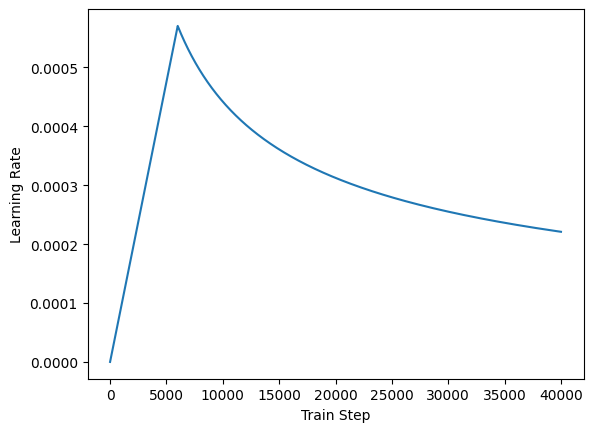

In [ ]:
plt.plot(learning_rate(tf.range(40000, dtype=tf.float32)))
plt.ylabel('Learning Rate')
plt.xlabel('Train Step')

## **10.4 Loss and Accuracy**

In [ ]:
def masked_loss(label, pred):
  mask = label != -1
  loss_object = tf.keras.losses.MeanSquaredError()
  loss = loss_object(label, pred)

  mask = tf.cast(mask, dtype=loss.dtype)
  loss *= mask

  loss = tf.reduce_sum(loss)/tf.reduce_sum(mask)
  return loss


"""def masked_accuracy(label, pred):
  pred = tf.argmax(pred, axis=2)
  label = tf.cast(label, pred.dtype)
  match = label == pred

  mask = label != -1

  match = match & mask

  match = tf.cast(match, dtype=tf.float32)
  mask = tf.cast(mask, dtype=tf.float32)
  return tf.reduce_sum(match)/tf.reduce_sum(mask)"""

'def masked_accuracy(label, pred):\n  pred = tf.argmax(pred, axis=2)\n  label = tf.cast(label, pred.dtype)\n  match = label == pred\n\n  mask = label != -1\n\n  match = match & mask\n\n  match = tf.cast(match, dtype=tf.float32)\n  mask = tf.cast(mask, dtype=tf.float32)\n  return tf.reduce_sum(match)/tf.reduce_sum(mask)'

## **10.5 Compile Model**

In [ ]:
transformer.compile(
    loss=masked_loss,
    optimizer=optimizer)

In [ ]:
#log_dir = "logs/fit/"
#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
#%tensorboard --logdir=logs/

# **11. Training**

## **11.1 Fit**

In [ ]:
# Fit the model using NumPy arrays
transformer.fit(train_dataset,
    epochs=NUM_EPOCHS,
    validation_data=val_dataset
)

Epoch 1/100
120/120 [==============================] - 46s 99ms/step - loss: 385.8597 - val_loss: 738.8438
Epoch 2/100
120/120 [==============================] - 9s 71ms/step - loss: 377.4008 - val_loss: 726.8059
Epoch 3/100
120/120 [==============================] - 9s 72ms/step - loss: 363.6640 - val_loss: 710.2487
Epoch 4/100
120/120 [==============================] - 9s 72ms/step - loss: 347.6924 - val_loss: 692.4813
Epoch 5/100
120/120 [==============================] - 9s 71ms/step - loss: 332.2612 - val_loss: 675.2232
Epoch 6/100
120/120 [==============================] - 9s 72ms/step - loss: 318.0865 - val_loss: 658.5781
Epoch 7/100
120/120 [==============================] - 9s 72ms/step - loss: 305.6203 - val_loss: 643.0940
Epoch 8/100
120/120 [==============================] - 9s 73ms/step - loss: 297.2474 - val_loss: 628.0843
Epoch 9/100
120/120 [==============================] - 9s 71ms/step - loss: 286.2654 - val_loss: 615.8688
Epoch 10/100
120/120 [=======================

## **11.2 Save to File Path**

In [ ]:
SAVE_FILE_PATH = os.path.join('drive', 'MyDrive', 'Data', "music_transformer_5_5")

In [ ]:
transformer.save_weights(SAVE_FILE_PATH)

## **11.3 Load From File Path**

In [ ]:
#SAVE_FILE_PATH = os.path.join('drive', 'MyDrive', 'Data', "music_transformer")

In [ ]:
# Create a new Transformer model with the same architecture
new_transformer = Transformer(
    num_layers=NUM_LAYERS,
    d_model=D_MODEL,
    num_features=FEATURE_EMBEDDINGS,
    num_heads=NUM_HEADS,
    d_k=D_K,
    dff=D_FF,
    input_vocab_size=INPUT_VOCAB_SIZE,
    target_vocab_size=OUTPUT_VOCAB_SIZE,
    dropout_rate=DROPOUT_RATE)

# Compile the new model with the same optimizer and loss functions
new_transformer.compile(
    optimizer=optimizer,
    loss=masked_loss)

# Load the saved weights into the new model
new_transformer.load_weights(SAVE_FILE_PATH)

In [ ]:
#transformer.save(SAVE_FILE_PATH, save_format="tf")

## **11.4 Run Inference**

In [ ]:
"""INPUTS = tf.data.Dataset.from_tensor_slices((inputX, inputY))"""

InternalError: ignored

In [ ]:
outputs = []

for time in range(np.shape(inputX)[0]):
  X = inputX[time]
  Y = inputY[time]
  X = tf.expand_dims(X, axis=0)
  Y = tf.expand_dims(Y, axis=0)
  output = new_transformer((X, Y)).numpy()[0,-1,:]
  outputs.append(output)

In [ ]:
outputs = np.array(outputs)

In [ ]:
outputs = np.concatenate((outputs, np.zeros((np.shape(inputX)[0], numFreqs-np.shape(outputs)[1]))), axis=1)

In [ ]:
"""for (time, (X, Y)) in enumerate(INPUTS):
  break"""

'for (time, (X, Y)) in enumerate(INPUTS):\n  break'

In [ ]:
# Concat original inputX audio to the front end. Also consider grabbing the
# first prediction rather than the last prediction when running inference.
# Basically the process for running inference needs some work - see my language
# transformer for a better example. Either lengthen the output sequence when
# predicting, or use a rolling window of collecting outputs and feeding them
# back in as inputX

#outputs = np.concatenate((X, outputs))

## **11.5 Plot Output Spectrogram**

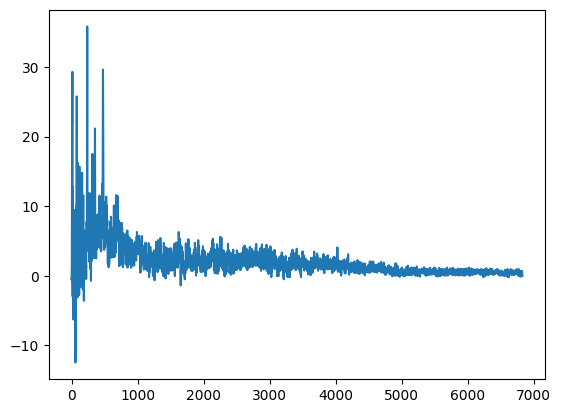

In [ ]:
plt.plot(new_transformer((X, Y)).numpy()[0,-1,:])

## **11.6 Raw Output Audio Quality - EAR TEST**

In [ ]:
phase = tf.random.uniform(shape=outputs.shape, minval=-np.pi, maxval=np.pi, dtype=tf.float32)
complex_data = tf.complex(outputs * tf.math.cos(phase), outputs * tf.math.sin(phase))
raw_reconstructed_signal = tf.signal.inverse_stft(
        complex_data, frame_length=FRAME_LENGTH, frame_step=FRAME_STEP)

In [ ]:
from IPython.display import Audio, display

In [ ]:
# Convert the reconstructed signal tensor to a NumPy array
raw_reconstructed_signal_np = raw_reconstructed_signal.numpy()

# Play the audio
display(Audio(raw_reconstructed_signal_np, rate=48000, autoplay=False))

In [ ]:
del Audio, display

## **11.7 Denoising**

In [ ]:
threshold = 0.01

outputs[outputs < threshold] = 0.0

## **11.8 Griffin-Lim Algorithm**

In [ ]:
# Assuming you have the magnitude_stft and the number of iterations
magnitude_stft = outputs
n_iter = 1000  # Adjust the number of iterations as needed

# Initialize the phase randomly
phase = tf.random.uniform(shape=magnitude_stft.shape, minval=-np.pi, maxval=np.pi, dtype=tf.float32)

for i in range(n_iter):
    # Reconstruct complex data
    complex_data = tf.complex(magnitude_stft * tf.math.cos(phase), magnitude_stft * tf.math.sin(phase))

    # Perform inverse STFT with the current phase
    reconstructed_signal = tf.signal.inverse_stft(
        complex_data, frame_length=FRAME_LENGTH, frame_step=FRAME_STEP)

    # Update the phase using the angle of the reconstructed signal
    phase = tf.math.angle(tf.signal.stft(reconstructed_signal, frame_length=FRAME_LENGTH, frame_step=FRAME_STEP))

## **11.9 Polished Audio Quality - EAR TEST**

In [ ]:
from IPython.display import Audio, display

In [ ]:
# Convert the reconstructed signal tensor to a NumPy array
reconstructed_signal_np = reconstructed_signal.numpy()

# Play the audio
display(Audio(reconstructed_signal_np, rate=48000, autoplay=True))

In [ ]:
del Audio, display